In [1]:
import os
import requests
import uuid
from io import BytesIO
import numpy as np
import pandas as pd
from PIL import Image

import tensorflow as tf
from keras.models import Model
from keras import layers
from keras.regularizers import l2

import matplotlib.pyplot as plt
import hashlib
import logging

# Configuración de logging
logging.basicConfig(
    level=logging.INFO,
    format='%(asctime)s - %(levelname)s - %(message)s',
    handlers=[
        logging.FileHandler("smote_process.log"),
        logging.StreamHandler()
    ]
)
logger = logging.getLogger(__name__)

print(f'tensorflow: {tf.__version__}')
print(f'keras: {tf.keras.__version__}')

tensorflow: 2.17.0
keras: 3.6.0


In [2]:
# Nombre del archivo de entrada
FILE_INPUT_CSV = 'yolo-output-yolo-datos-de-produccion-raw.csv'
FILE_INPUT_OUT = 'out_' + FILE_INPUT_CSV

# Columnas para etiquetar
LABEL_COLUMNS = ['direccion', 'fachada', 'envio', 'etiqueta', 'planilla']

In [ ]:
# Leer el archivo CSV
df_input = pd.read_csv(FILE_INPUT_CSV, sep=';')

# Diccionario para almacenar el contenido de entrada
input_content = {}

# Iterar sobre las filas del DataFrame
for index, row in df_input.iterrows():
    # Obtener la URL
    url = row['urlAbsoluta']
    
    # Verificar si la URL no está vacía
    if pd.notna(url):
        # Obtener las etiquetas
        labels = row[LABEL_COLUMNS].values.astype(int)

        if index < 2:
            # Imprimir información de depuración
            print(f"Fila {index}:")
            print(f"URL: {url}")
            print(f"Etiquetas: {labels}")
        
        # Si la URL no está en el diccionario, agregarla
        if url not in input_content:
            input_content[url] = {
                'filename': os.path.basename(url),
                'urlAbsoluta': url,
                'direccion': labels[0],
                'fachada': labels[1],
                'envio': labels[2],
                'etiqueta': labels[3],
                'planilla': labels[4],
                'clases': row['clases'],
                'idArchivoEnvio': row['idArchivoEnvio'],
                'idArchivoCriterio': row['idArchivoCriterio']
            }
        else:
            # Si la URL ya existe, actualizar las etiquetas
            input_content[url]['direccion'] = 1 if input_content[url]['direccion'] == 1 else labels[0]
            input_content[url]['fachada'] = 1 if input_content[url]['fachada'] == 1 else labels[1]
            input_content[url]['envio'] =  1 if input_content[url]['envio'] == 1 else  labels[2]
            input_content[url]['etiqueta'] =  1 if input_content[url]['etiqueta'] == 1 else labels[3]
            input_content[url]['planilla'] =  1 if input_content[url]['planilla'] == 1 else labels[4]

# Crear un DataFrame a partir del diccionario
df = pd.DataFrame.from_dict(input_content, orient="index")

# Guardar el DataFrame en un archivo CSV
df.to_csv(FILE_INPUT_OUT, index=False)

print('Archivo guardado exitosamente')

(1) Indefinido, (2) Dirección, (3) Envío, (4) Etiqueta, (5) Fachada, (6) Recepción (7) Planilla
-->> row: Unnamed: 0                                                     0
filename                        12759528681_2024121611192353.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       0
planilla                                                       0
Name: 0, dtype: object
img_path: ./repo_validation\12759528681_2024121611192353.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
0 : Predicciones MobilNet (probabilidades): [[0.75708735 0.4919907  0.10941671 0.06665929 0.05969264]]
0 : Predicciones (MobilNet): [1 0 0 0 0]
0 : Predicciones (Yolo): [1 0 0 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'planilla']
pred_match 1


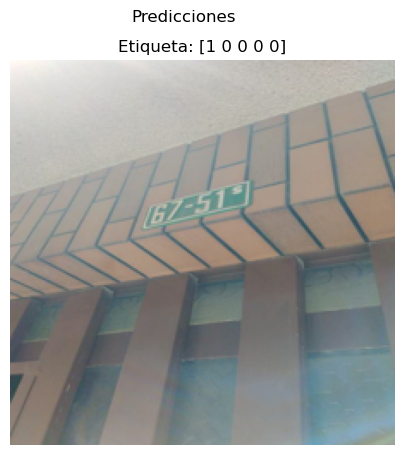



-->> row: Unnamed: 0                                                     1
filename                        12759534262_2024121616364845.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          1
etiqueta                                                       1
planilla                                                       0
Name: 1, dtype: object
img_path: ./repo_validation\12759534262_2024121616364845.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759534262_2024121616364845.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
1 : Predicciones MobilNet (probabilidades): [[0.09326355 0.09691509 0.7283783  0.82314885 0.08171041]]
1 : Predicciones (MobilNet): [0 0 1 1 0]
1 : Predicciones (Yolo): [1 0 1 1 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'planill

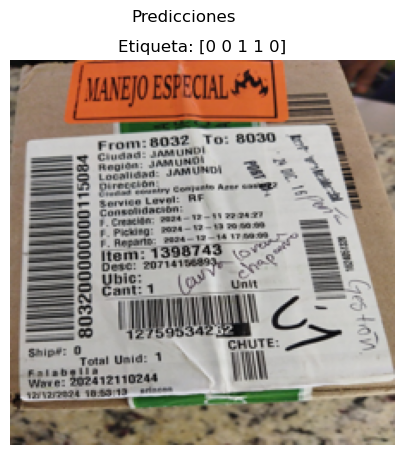



-->> row: Unnamed: 0                                                     2
filename                        12758922763_2024121811024432.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          1
etiqueta                                                       1
planilla                                                       0
Name: 2, dtype: object
img_path: ./repo_validation\12758922763_2024121811024432.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12758922763_2024121811024432.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
2 : Predicciones MobilNet (probabilidades): [[0.1178041  0.11649144 0.6020177  0.7827696  0.13909864]]
2 : Predicciones (MobilNet): [0 0 1 1 0]
2 : Predicciones (Yolo): [1 0 1 1 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'planill

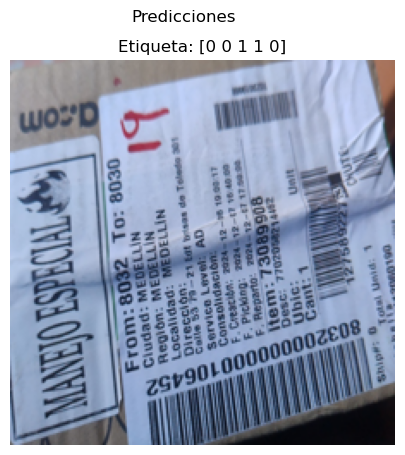



-->> row: Unnamed: 0                                                     3
filename                        12758606571_2024122108205378.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        1
envio                                                          0
etiqueta                                                       1
planilla                                                       0
Name: 3, dtype: object
img_path: ./repo_validation\12758606571_2024122108205378.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12758606571_2024122108205378.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
3 : Predicciones MobilNet (probabilidades): [[0.39406312 0.52151597 0.24396157 0.18516122 0.27890596]]
3 : Predicciones (MobilNet): [0 1 0 0 0]
3 : Predicciones (Yolo): [1 1 0 1 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'planill

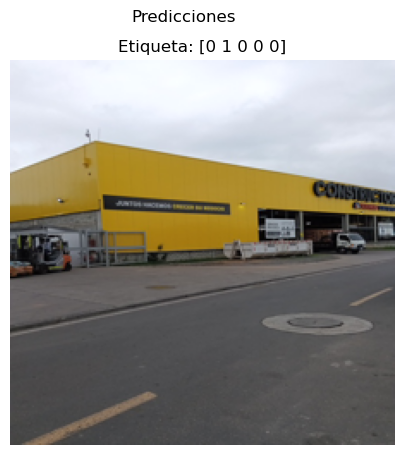



-->> row: Unnamed: 0                                                     4
filename                        12759633705_2024121510261785.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          1
etiqueta                                                       1
planilla                                                       0
Name: 4, dtype: object
img_path: ./repo_validation\12759633705_2024121510261785.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759633705_2024121510261785.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
4 : Predicciones MobilNet (probabilidades): [[0.06939059 0.07001784 0.8419441  0.831586   0.05195216]]
4 : Predicciones (MobilNet): [0 0 1 1 0]
4 : Predicciones (Yolo): [1 0 1 1 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'planill

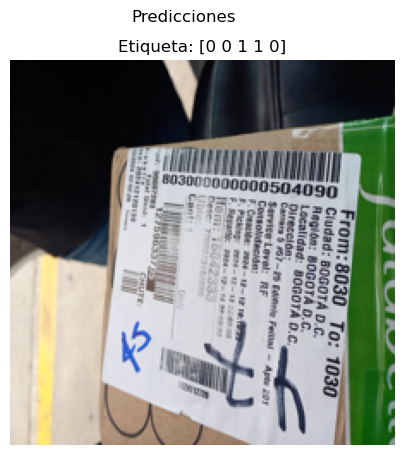



-->> row: Unnamed: 0                                                     5
filename                        12759453143_2024121707563552.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        1
envio                                                          0
etiqueta                                                       0
planilla                                                       0
Name: 5, dtype: object
img_path: ./repo_validation\12759453143_2024121707563552.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759453143_2024121707563552.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
5 : Predicciones MobilNet (probabilidades): [[0.72910863 0.58342326 0.12090251 0.10311431 0.07479695]]
5 : Predicciones (MobilNet): [1 1 0 0 0]
5 : Predicciones (Yolo): [1 1 0 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'planill

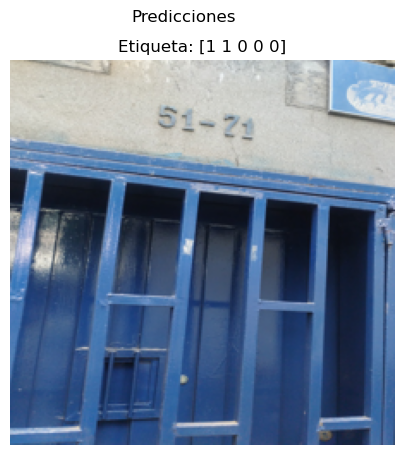



-->> row: Unnamed: 0                                                     6
filename                        12759339157_2024121909402839.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        1
envio                                                          0
etiqueta                                                       0
planilla                                                       0
Name: 6, dtype: object
img_path: ./repo_validation\12759339157_2024121909402839.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759339157_2024121909402839.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
6 : Predicciones MobilNet (probabilidades): [[0.4675031  0.47947496 0.36132076 0.19529949 0.07722657]]
6 : Predicciones (MobilNet): [0 0 0 0 0]
6 : Predicciones (Yolo): [1 1 0 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'planill

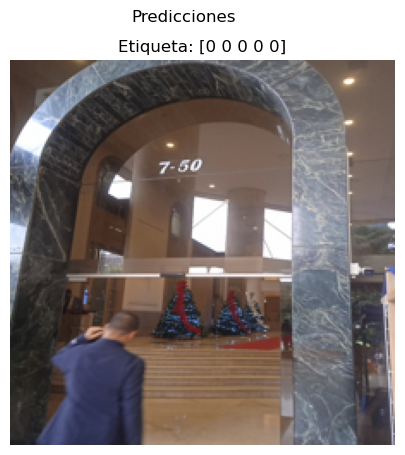



-->> row: Unnamed: 0                                                     7
filename                        12758733932_2024121916002229.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          1
etiqueta                                                       0
planilla                                                       0
Name: 7, dtype: object
img_path: ./repo_validation\12758733932_2024121916002229.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12758733932_2024121916002229.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
7 : Predicciones MobilNet (probabilidades): [[0.16340132 0.14907835 0.82555526 0.5795535  0.07664653]]
7 : Predicciones (MobilNet): [0 0 1 1 0]
7 : Predicciones (Yolo): [1 0 1 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'planill

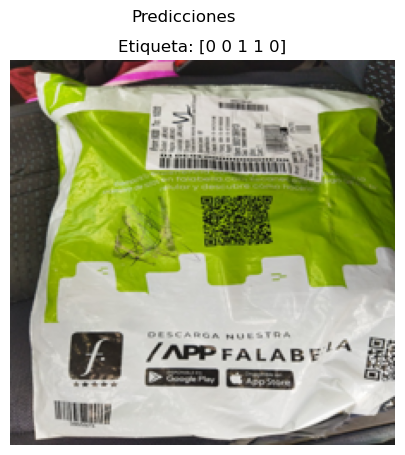



-->> row: Unnamed: 0                                                     8
filename                        12759655677_2024121714381063.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       0
planilla                                                       0
Name: 8, dtype: object
img_path: ./repo_validation\12759655677_2024121714381063.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759655677_2024121714381063.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
8 : Predicciones MobilNet (probabilidades): [[0.10933316 0.10955156 0.23925743 0.207759   0.81011146]]
8 : Predicciones (MobilNet): [0 0 0 0 1]
8 : Predicciones (Yolo): [1 0 0 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'planill

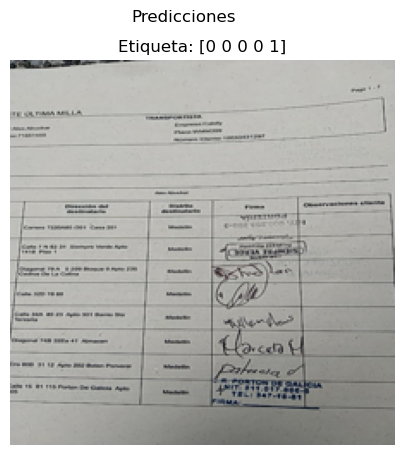



-->> row: Unnamed: 0                                                     9
filename                        12757440879_2024121609020607.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        1
envio                                                          0
etiqueta                                                       0
planilla                                                       0
Name: 9, dtype: object
img_path: ./repo_validation\12757440879_2024121609020607.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12757440879_2024121609020607.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step
9 : Predicciones MobilNet (probabilidades): [[0.530087   0.69479835 0.1882871  0.15619574 0.06993835]]
9 : Predicciones (MobilNet): [1 1 0 0 0]
9 : Predicciones (Yolo): [1 1 0 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'planill

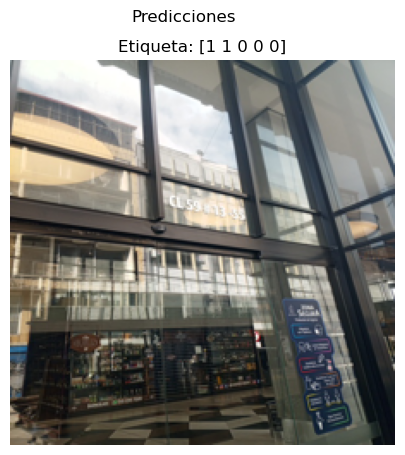



-->> row: Unnamed: 0                                                    10
filename                        12759469472_2024121613403035.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       1
planilla                                                       0
Name: 10, dtype: object
img_path: ./repo_validation\12759469472_2024121613403035.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759469472_2024121613403035.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
10 : Predicciones MobilNet (probabilidades): [[0.13503815 0.1418306  0.64570385 0.82007635 0.07511828]]
10 : Predicciones (MobilNet): [0 0 1 1 0]
10 : Predicciones (Yolo): [1 0 0 1 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

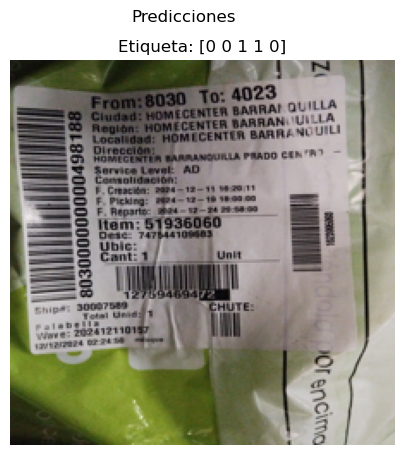



-->> row: Unnamed: 0                                                    11
filename                        12759699046_2024121612042320.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       0
planilla                                                       0
Name: 11, dtype: object
img_path: ./repo_validation\12759699046_2024121612042320.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759699046_2024121612042320.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
11 : Predicciones MobilNet (probabilidades): [[0.07362757 0.06311339 0.37989932 0.33889788 0.6574929 ]]
11 : Predicciones (MobilNet): [0 0 0 0 1]
11 : Predicciones (Yolo): [1 0 0 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

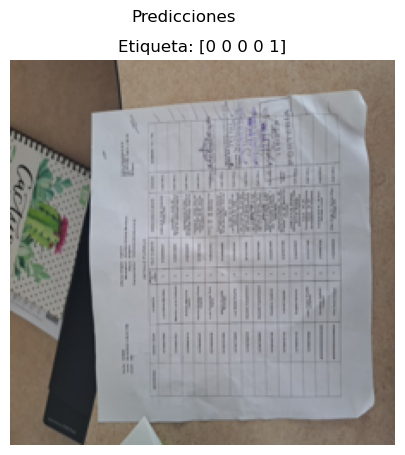



-->> row: Unnamed: 0                                                    12
filename                        12759521583_2024121614020743.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       1
planilla                                                       0
Name: 12, dtype: object
img_path: ./repo_validation\12759521583_2024121614020743.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759521583_2024121614020743.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step
12 : Predicciones MobilNet (probabilidades): [[0.12476556 0.12882733 0.65874124 0.7522901  0.1109759 ]]
12 : Predicciones (MobilNet): [0 0 1 1 0]
12 : Predicciones (Yolo): [1 0 0 1 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

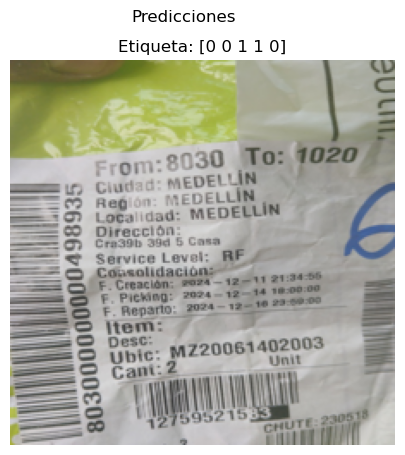



-->> row: Unnamed: 0                                                    13
filename                        12759482600_2024121516382588.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       0
planilla                                                       0
Name: 13, dtype: object
img_path: ./repo_validation\12759482600_2024121516382588.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759482600_2024121516382588.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step
13 : Predicciones MobilNet (probabilidades): [[0.7622482  0.46869844 0.11017551 0.08128316 0.03104659]]
13 : Predicciones (MobilNet): [1 0 0 0 0]
13 : Predicciones (Yolo): [1 0 0 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

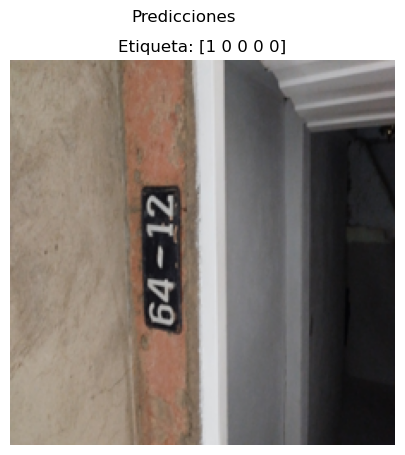



-->> row: Unnamed: 0                                                    14
filename                        12759083937_2024121809031128.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       0
planilla                                                       0
Name: 14, dtype: object
img_path: ./repo_validation\12759083937_2024121809031128.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759083937_2024121809031128.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
14 : Predicciones MobilNet (probabilidades): [[0.5418685  0.50132763 0.3322364  0.16186991 0.08972206]]
14 : Predicciones (MobilNet): [1 1 0 0 0]
14 : Predicciones (Yolo): [1 0 0 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

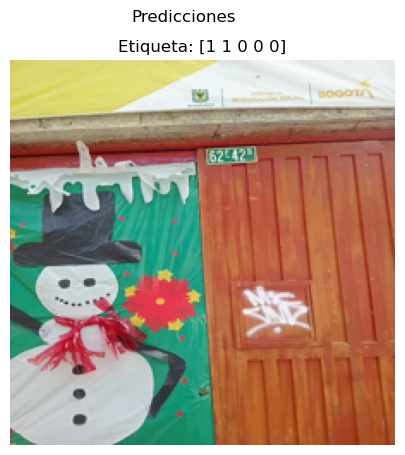



-->> row: Unnamed: 0                                                    15
filename                        12759695161_2024121712362645.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       1
planilla                                                       0
Name: 15, dtype: object
img_path: ./repo_validation\12759695161_2024121712362645.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759695161_2024121712362645.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
15 : Predicciones MobilNet (probabilidades): [[0.1067047  0.11300205 0.7106387  0.83194757 0.05778832]]
15 : Predicciones (MobilNet): [0 0 1 1 0]
15 : Predicciones (Yolo): [1 0 0 1 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

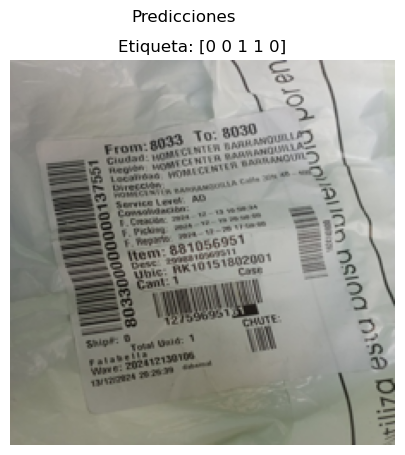



-->> row: Unnamed: 0                                                    16
filename                        12759599377_2024121810404551.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          1
etiqueta                                                       1
planilla                                                       0
Name: 16, dtype: object
img_path: ./repo_validation\12759599377_2024121810404551.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759599377_2024121810404551.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step
16 : Predicciones MobilNet (probabilidades): [[0.11255717 0.12953588 0.85920566 0.68449086 0.04882181]]
16 : Predicciones (MobilNet): [0 0 1 1 0]
16 : Predicciones (Yolo): [1 0 1 1 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

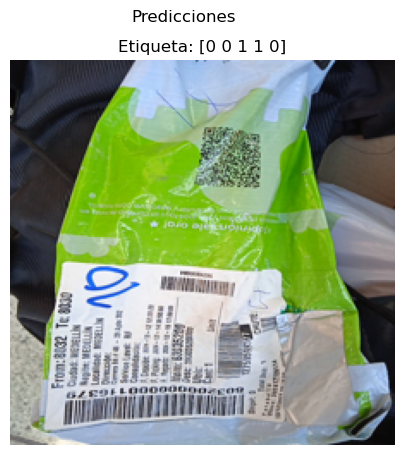



-->> row: Unnamed: 0                                                    17
filename                        12759534347_2024121712263999.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       1
planilla                                                       0
Name: 17, dtype: object
img_path: ./repo_validation\12759534347_2024121712263999.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759534347_2024121712263999.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step
17 : Predicciones MobilNet (probabilidades): [[0.11840581 0.12564918 0.6817     0.8492     0.05780443]]
17 : Predicciones (MobilNet): [0 0 1 1 0]
17 : Predicciones (Yolo): [1 0 0 1 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

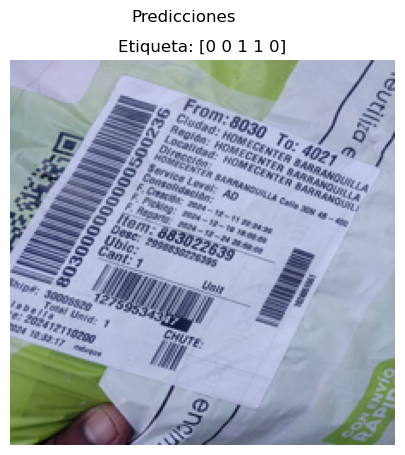



-->> row: Unnamed: 0                                                    18
filename                        12759694577_2024121510204621.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        1
envio                                                          0
etiqueta                                                       0
planilla                                                       0
Name: 18, dtype: object
img_path: ./repo_validation\12759694577_2024121510204621.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759694577_2024121510204621.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
18 : Predicciones MobilNet (probabilidades): [[0.7556445  0.6349112  0.07544897 0.06454021 0.04456807]]
18 : Predicciones (MobilNet): [1 1 0 0 0]
18 : Predicciones (Yolo): [1 1 0 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

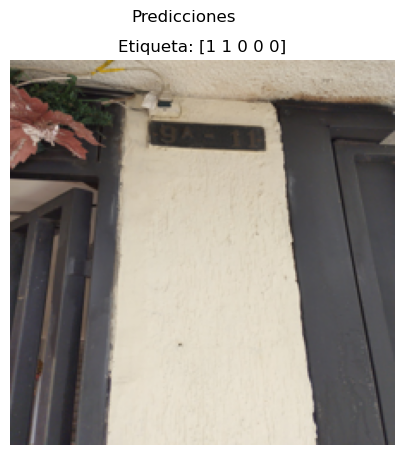



-->> row: Unnamed: 0                                                    19
filename                        12759549341_2024121613505570.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       1
planilla                                                       0
Name: 19, dtype: object
img_path: ./repo_validation\12759549341_2024121613505570.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759549341_2024121613505570.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step
19 : Predicciones MobilNet (probabilidades): [[0.13253365 0.13759322 0.57670194 0.83184254 0.08084877]]
19 : Predicciones (MobilNet): [0 0 1 1 0]
19 : Predicciones (Yolo): [1 0 0 1 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

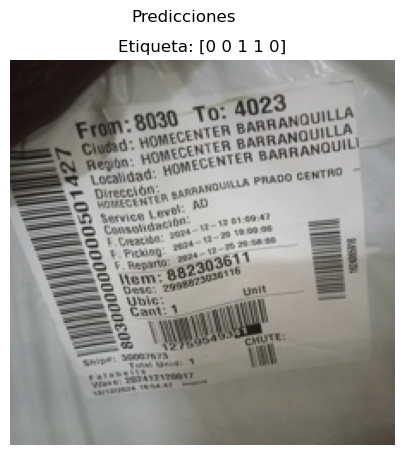



-->> row: Unnamed: 0                                                    20
filename                        12759682031_2024121519390602.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       1
planilla                                                       0
Name: 20, dtype: object
img_path: ./repo_validation\12759682031_2024121519390602.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759682031_2024121519390602.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
20 : Predicciones MobilNet (probabilidades): [[0.1150202  0.11363794 0.11716831 0.10229717 0.9203656 ]]
20 : Predicciones (MobilNet): [0 0 0 0 1]
20 : Predicciones (Yolo): [1 0 0 1 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

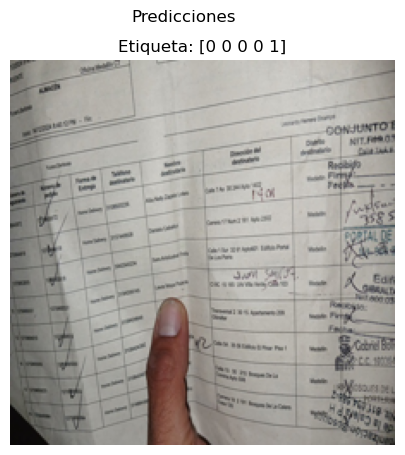



-->> row: Unnamed: 0                                                    21
filename                        12759620644_2024121712361186.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       0
planilla                                                       0
Name: 21, dtype: object
img_path: ./repo_validation\12759620644_2024121712361186.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759620644_2024121712361186.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step
21 : Predicciones MobilNet (probabilidades): [[0.22237809 0.16838704 0.1356821  0.13290824 0.83522695]]
21 : Predicciones (MobilNet): [0 0 0 0 1]
21 : Predicciones (Yolo): [1 0 0 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

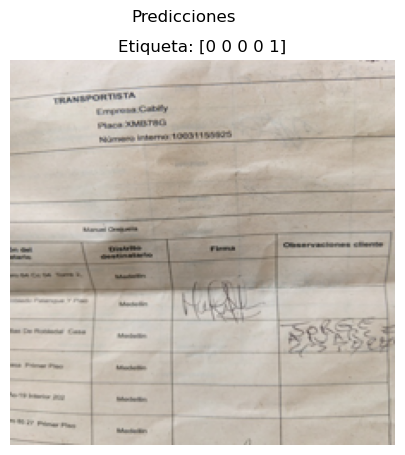



-->> row: Unnamed: 0                                                    22
filename                        12759494740_2024121613445474.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       1
planilla                                                       0
Name: 22, dtype: object
img_path: ./repo_validation\12759494740_2024121613445474.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759494740_2024121613445474.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
22 : Predicciones MobilNet (probabilidades): [[0.15080807 0.1451403  0.71555185 0.78740215 0.07675512]]
22 : Predicciones (MobilNet): [0 0 1 1 0]
22 : Predicciones (Yolo): [1 0 0 1 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

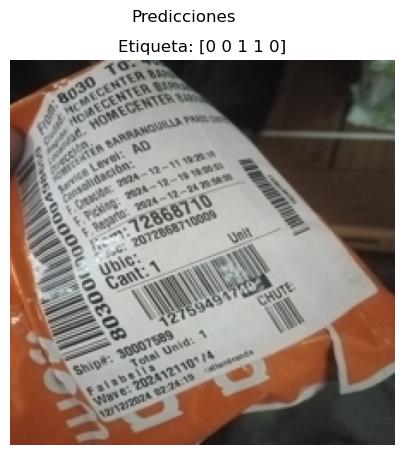



-->> row: Unnamed: 0                                                    23
filename                        12759642202_2024121613564719.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       0
planilla                                                       0
Name: 23, dtype: object
img_path: ./repo_validation\12759642202_2024121613564719.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759642202_2024121613564719.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step
23 : Predicciones MobilNet (probabilidades): [[0.13520236 0.11625994 0.16331369 0.16084464 0.87066066]]
23 : Predicciones (MobilNet): [0 0 0 0 1]
23 : Predicciones (Yolo): [1 0 0 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

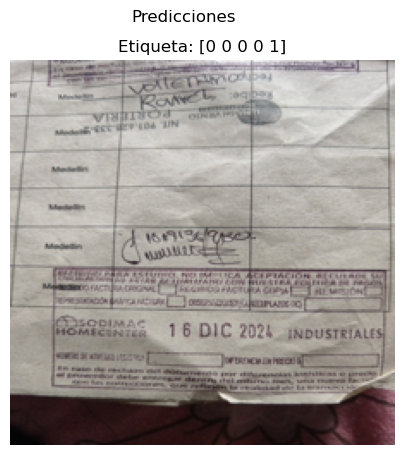



-->> row: Unnamed: 0                                                    24
filename                        12759696731_2024121610231998.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          1
etiqueta                                                       1
planilla                                                       0
Name: 24, dtype: object
img_path: ./repo_validation\12759696731_2024121610231998.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759696731_2024121610231998.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
24 : Predicciones MobilNet (probabilidades): [[0.13872392 0.13830054 0.74103403 0.7906     0.07750979]]
24 : Predicciones (MobilNet): [0 0 1 1 0]
24 : Predicciones (Yolo): [1 0 1 1 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

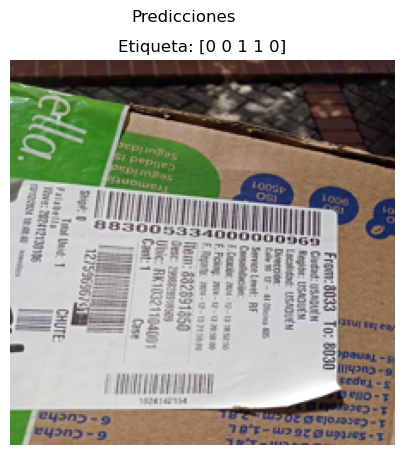



-->> row: Unnamed: 0                                                    25
filename                        12756677962_2024122311351027.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          1
etiqueta                                                       0
planilla                                                       0
Name: 25, dtype: object
img_path: ./repo_validation\12756677962_2024122311351027.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12756677962_2024122311351027.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step
25 : Predicciones MobilNet (probabilidades): [[0.39787316 0.35067004 0.593377   0.21468823 0.05554533]]
25 : Predicciones (MobilNet): [0 0 1 0 0]
25 : Predicciones (Yolo): [1 0 1 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

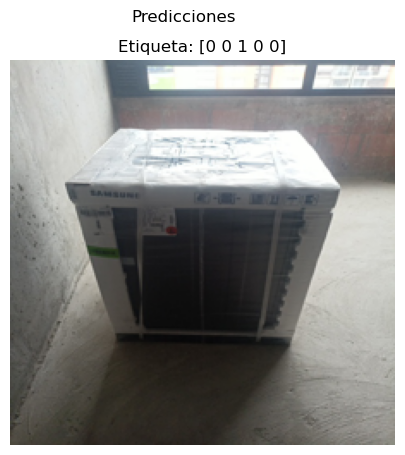



-->> row: Unnamed: 0                                                    26
filename                        12757273859_2024121614044221.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          1
etiqueta                                                       0
planilla                                                       0
Name: 26, dtype: object
img_path: ./repo_validation\12757273859_2024121614044221.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12757273859_2024121614044221.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step
26 : Predicciones MobilNet (probabilidades): [[0.75140214 0.5150491  0.14954972 0.1170814  0.04609247]]
26 : Predicciones (MobilNet): [1 1 0 0 0]
26 : Predicciones (Yolo): [1 0 1 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

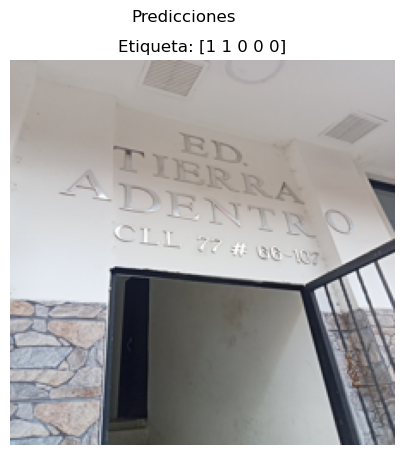



-->> row: Unnamed: 0                                                    27
filename                        12759486479_2024121917015285.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          1
etiqueta                                                       0
planilla                                                       0
Name: 27, dtype: object
img_path: ./repo_validation\12759486479_2024121917015285.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759486479_2024121917015285.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step
27 : Predicciones MobilNet (probabilidades): [[0.10630821 0.12526785 0.65896976 0.8244393  0.0642038 ]]
27 : Predicciones (MobilNet): [0 0 1 1 0]
27 : Predicciones (Yolo): [1 0 1 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

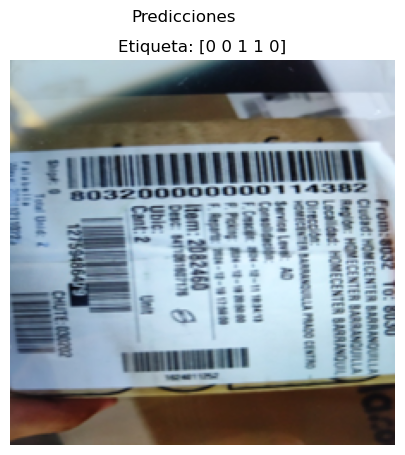



-->> row: Unnamed: 0                                                    28
filename                        12759545381_2024121418503472.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          1
etiqueta                                                       1
planilla                                                       0
Name: 28, dtype: object
img_path: ./repo_validation\12759545381_2024121418503472.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759545381_2024121418503472.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 277ms/step
28 : Predicciones MobilNet (probabilidades): [[0.07688104 0.08200426 0.72221977 0.83776677 0.06494015]]
28 : Predicciones (MobilNet): [0 0 1 1 0]
28 : Predicciones (Yolo): [1 0 1 1 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

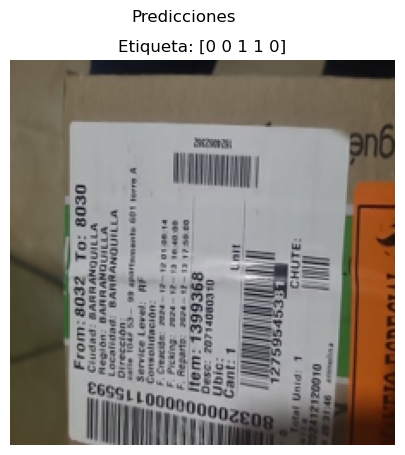



-->> row: Unnamed: 0                                                    29
filename                        12759644978_2024121510265074.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          1
etiqueta                                                       0
planilla                                                       0
Name: 29, dtype: object
img_path: ./repo_validation\12759644978_2024121510265074.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759644978_2024121510265074.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
29 : Predicciones MobilNet (probabilidades): [[0.12305377 0.13266382 0.8859138  0.42552426 0.05530244]]
29 : Predicciones (MobilNet): [0 0 1 0 0]
29 : Predicciones (Yolo): [1 0 1 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

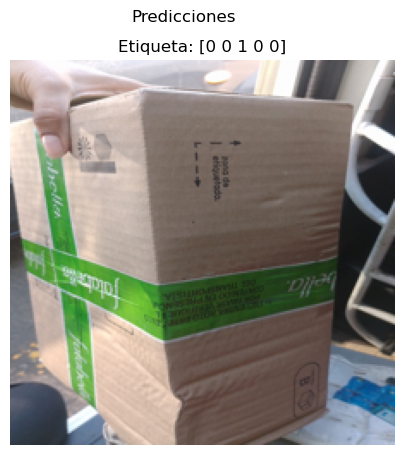



-->> row: Unnamed: 0                                                    30
filename                        12759619945_2024121509444178.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        1
envio                                                          0
etiqueta                                                       0
planilla                                                       0
Name: 30, dtype: object
img_path: ./repo_validation\12759619945_2024121509444178.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759619945_2024121509444178.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step
30 : Predicciones MobilNet (probabilidades): [[0.80206853 0.51866704 0.13392153 0.10702994 0.0295623 ]]
30 : Predicciones (MobilNet): [1 1 0 0 0]
30 : Predicciones (Yolo): [1 1 0 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

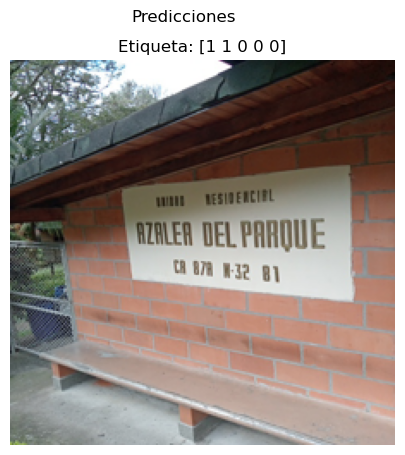



-->> row: Unnamed: 0                                                    31
filename                        12759604743_2024121418371483.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       1
planilla                                                       0
Name: 31, dtype: object
img_path: ./repo_validation\12759604743_2024121418371483.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759604743_2024121418371483.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step
31 : Predicciones MobilNet (probabilidades): [[0.1676595  0.16471826 0.6271465  0.81150424 0.09205493]]
31 : Predicciones (MobilNet): [0 0 1 1 0]
31 : Predicciones (Yolo): [1 0 0 1 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

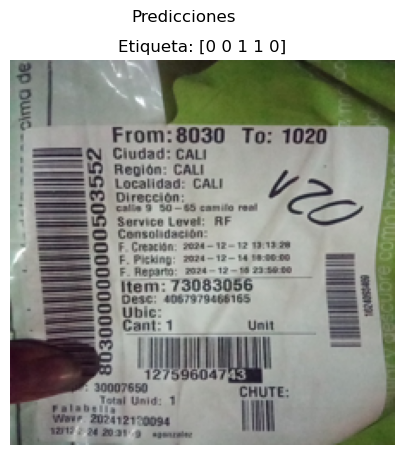



-->> row: Unnamed: 0                                                    32
filename                        12759439932_2024121712111484.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       0
planilla                                                       0
Name: 32, dtype: object
img_path: ./repo_validation\12759439932_2024121712111484.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759439932_2024121712111484.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step
32 : Predicciones MobilNet (probabilidades): [[0.76726454 0.48262239 0.15069476 0.12807211 0.07387313]]
32 : Predicciones (MobilNet): [1 0 0 0 0]
32 : Predicciones (Yolo): [1 0 0 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

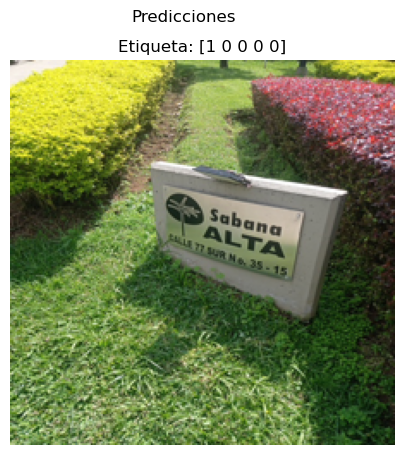



-->> row: Unnamed: 0                                                    33
filename                        12759698124_2024121713553570.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        1
envio                                                          0
etiqueta                                                       0
planilla                                                       0
Name: 33, dtype: object
img_path: ./repo_validation\12759698124_2024121713553570.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759698124_2024121713553570.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
33 : Predicciones MobilNet (probabilidades): [[0.56932974 0.7975037  0.09065757 0.07547484 0.03790396]]
33 : Predicciones (MobilNet): [1 1 0 0 0]
33 : Predicciones (Yolo): [1 1 0 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

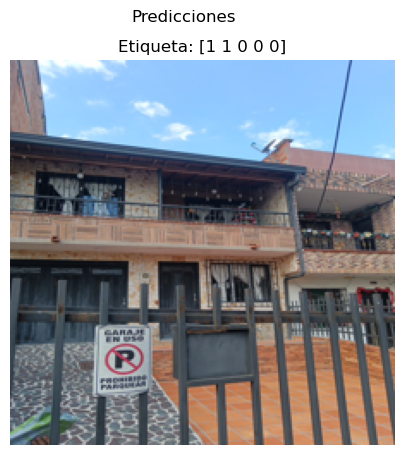



-->> row: Unnamed: 0                                                    34
filename                        12759647948_2024121510195845.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          1
etiqueta                                                       1
planilla                                                       0
Name: 34, dtype: object
img_path: ./repo_validation\12759647948_2024121510195845.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759647948_2024121510195845.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
34 : Predicciones MobilNet (probabilidades): [[0.17827715 0.16520745 0.6507783  0.6913804  0.15623322]]
34 : Predicciones (MobilNet): [0 0 1 1 0]
34 : Predicciones (Yolo): [1 0 1 1 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

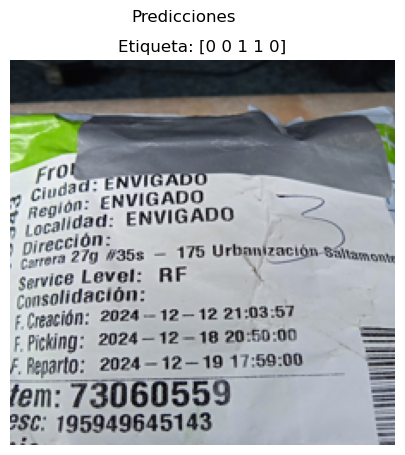



-->> row: Unnamed: 0                                                    35
filename                        12757991210_2024121611244926.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          1
etiqueta                                                       0
planilla                                                       0
Name: 35, dtype: object
img_path: ./repo_validation\12757991210_2024121611244926.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12757991210_2024121611244926.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step
35 : Predicciones MobilNet (probabilidades): [[0.57341945 0.5085025  0.3706831  0.19723403 0.07312511]]
35 : Predicciones (MobilNet): [1 1 0 0 0]
35 : Predicciones (Yolo): [1 0 1 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

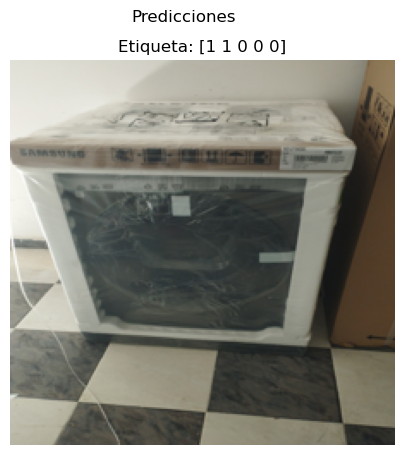



-->> row: Unnamed: 0                                                    36
filename                        12756088300_2025011810572839.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       0
planilla                                                       0
Name: 36, dtype: object
img_path: ./repo_validation\12756088300_2025011810572839.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2025/01/12756088300_2025011810572839.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
36 : Predicciones MobilNet (probabilidades): [[0.12693284 0.11183213 0.3954108  0.52162397 0.40925467]]
36 : Predicciones (MobilNet): [0 0 0 1 0]
36 : Predicciones (Yolo): [1 0 0 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

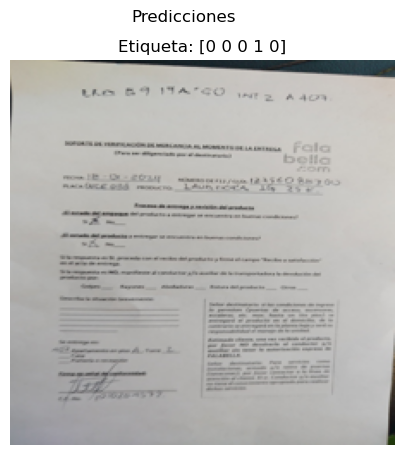



-->> row: Unnamed: 0                                                    37
filename                        12759579027_2024121808171353.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       1
planilla                                                       0
Name: 37, dtype: object
img_path: ./repo_validation\12759579027_2024121808171353.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759579027_2024121808171353.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step
37 : Predicciones MobilNet (probabilidades): [[0.11573163 0.12278641 0.65312386 0.8324776  0.09330233]]
37 : Predicciones (MobilNet): [0 0 1 1 0]
37 : Predicciones (Yolo): [1 0 0 1 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

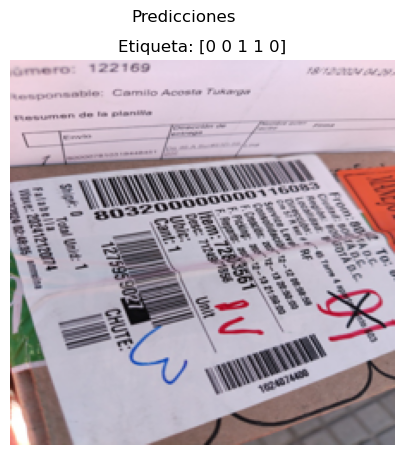



-->> row: Unnamed: 0                                                    38
filename                        12759485564_2024121419002450.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       0
planilla                                                       0
Name: 38, dtype: object
img_path: ./repo_validation\12759485564_2024121419002450.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759485564_2024121419002450.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step
38 : Predicciones MobilNet (probabilidades): [[0.17221028 0.17800592 0.10611422 0.09674677 0.88583493]]
38 : Predicciones (MobilNet): [0 0 0 0 1]
38 : Predicciones (Yolo): [1 0 0 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

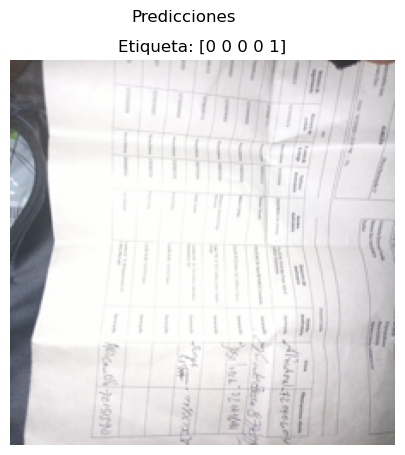



-->> row: Unnamed: 0                                                    39
filename                        12756889020_2025011710184882.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       1
planilla                                                       0
Name: 39, dtype: object
img_path: ./repo_validation\12756889020_2025011710184882.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2025/01/12756889020_2025011710184882.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
39 : Predicciones MobilNet (probabilidades): [[0.11439031 0.11315101 0.40377587 0.3689786  0.5499009 ]]
39 : Predicciones (MobilNet): [0 0 0 0 1]
39 : Predicciones (Yolo): [1 0 0 1 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

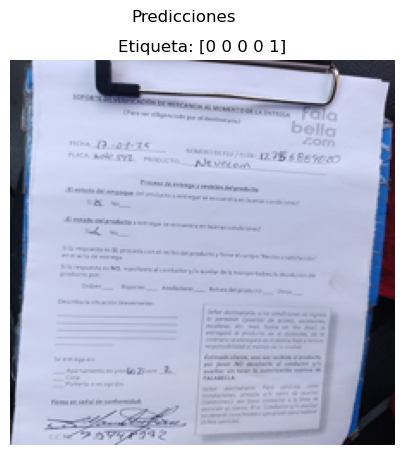



-->> row: Unnamed: 0                                                    40
filename                        12759412201_2024121612462795.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        1
envio                                                          0
etiqueta                                                       0
planilla                                                       0
Name: 40, dtype: object
img_path: ./repo_validation\12759412201_2024121612462795.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759412201_2024121612462795.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
40 : Predicciones MobilNet (probabilidades): [[0.55718386 0.695753   0.20313093 0.15601222 0.07402547]]
40 : Predicciones (MobilNet): [1 1 0 0 0]
40 : Predicciones (Yolo): [1 1 0 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

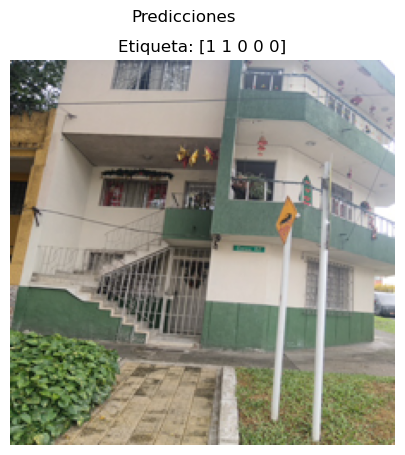



-->> row: Unnamed: 0                                                    41
filename                        12758983849_2024121511272505.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        1
envio                                                          0
etiqueta                                                       0
planilla                                                       0
Name: 41, dtype: object
img_path: ./repo_validation\12758983849_2024121511272505.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12758983849_2024121511272505.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
41 : Predicciones MobilNet (probabilidades): [[0.6090408  0.6540868  0.21486524 0.2249297  0.13095847]]
41 : Predicciones (MobilNet): [1 1 0 0 0]
41 : Predicciones (Yolo): [1 1 0 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

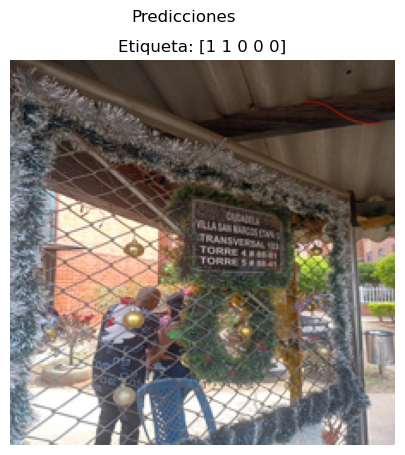



-->> row: Unnamed: 0                                                    42
filename                        12759485236_2024121613435972.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       1
planilla                                                       0
Name: 42, dtype: object
img_path: ./repo_validation\12759485236_2024121613435972.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759485236_2024121613435972.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step
42 : Predicciones MobilNet (probabilidades): [[0.15465519 0.14912619 0.6083299  0.8418613  0.0788596 ]]
42 : Predicciones (MobilNet): [0 0 1 1 0]
42 : Predicciones (Yolo): [1 0 0 1 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

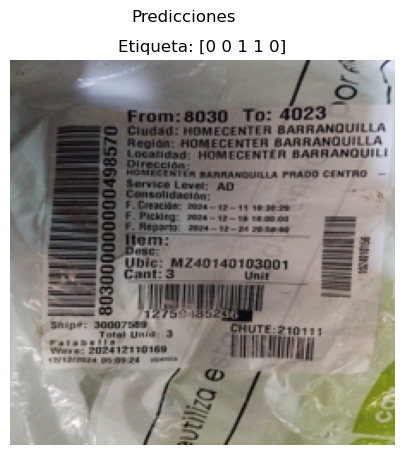



-->> row: Unnamed: 0                                                    43
filename                        12759698520_2024121507115603.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        1
envio                                                          0
etiqueta                                                       0
planilla                                                       0
Name: 43, dtype: object
img_path: ./repo_validation\12759698520_2024121507115603.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759698520_2024121507115603.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step
43 : Predicciones MobilNet (probabilidades): [[0.6614618  0.59365535 0.23211871 0.15737288 0.08985563]]
43 : Predicciones (MobilNet): [1 1 0 0 0]
43 : Predicciones (Yolo): [1 1 0 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

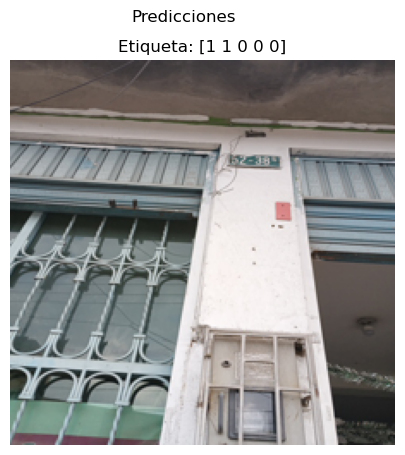



-->> row: Unnamed: 0                                                    44
filename                        12759697127_2024121511563456.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       1
planilla                                                       0
Name: 44, dtype: object
img_path: ./repo_validation\12759697127_2024121511563456.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759697127_2024121511563456.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step
44 : Predicciones MobilNet (probabilidades): [[0.07758088 0.07670137 0.08334055 0.07002474 0.96356755]]
44 : Predicciones (MobilNet): [0 0 0 0 1]
44 : Predicciones (Yolo): [1 0 0 1 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

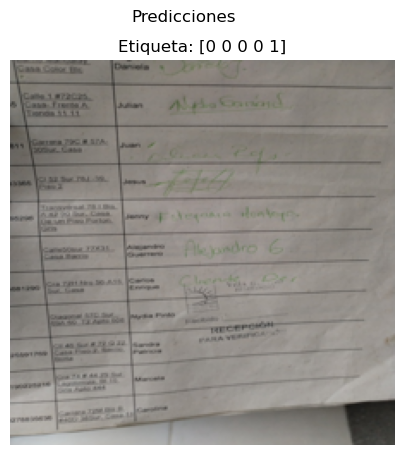



-->> row: Unnamed: 0                                                    45
filename                        12759494856_2024121713435870.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       0
planilla                                                       0
Name: 45, dtype: object
img_path: ./repo_validation\12759494856_2024121713435870.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759494856_2024121713435870.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
45 : Predicciones MobilNet (probabilidades): [[0.649745   0.411473   0.27928856 0.21329796 0.07997955]]
45 : Predicciones (MobilNet): [1 0 0 0 0]
45 : Predicciones (Yolo): [1 0 0 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

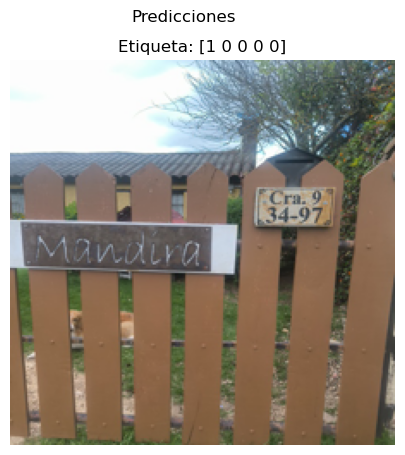



-->> row: Unnamed: 0                                                    46
filename                        12759697660_2024121511433491.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       0
planilla                                                       0
Name: 46, dtype: object
img_path: ./repo_validation\12759697660_2024121511433491.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759697660_2024121511433491.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
46 : Predicciones MobilNet (probabilidades): [[0.7503324  0.6206275  0.12023077 0.09178855 0.03595764]]
46 : Predicciones (MobilNet): [1 1 0 0 0]
46 : Predicciones (Yolo): [1 0 0 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

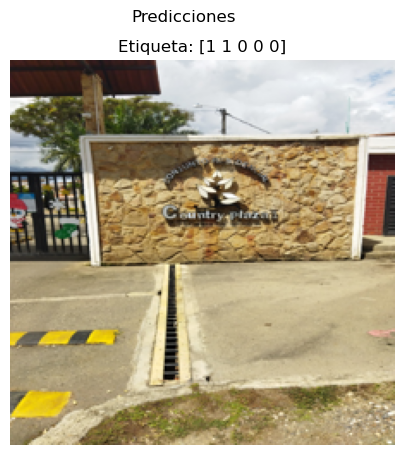



-->> row: Unnamed: 0                                                    47
filename                        12759593993_2024121417244096.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        1
envio                                                          0
etiqueta                                                       0
planilla                                                       0
Name: 47, dtype: object
img_path: ./repo_validation\12759593993_2024121417244096.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759593993_2024121417244096.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
47 : Predicciones MobilNet (probabilidades): [[0.5780647  0.5772261  0.18897295 0.14655353 0.09279698]]
47 : Predicciones (MobilNet): [1 1 0 0 0]
47 : Predicciones (Yolo): [1 1 0 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

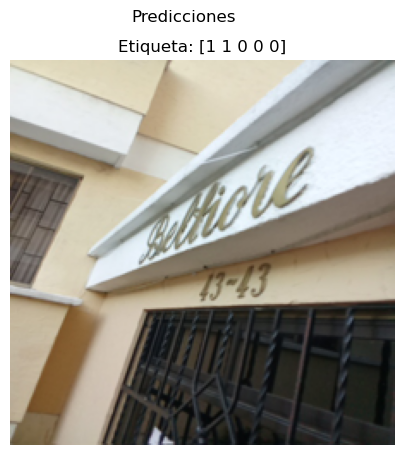



-->> row: Unnamed: 0                                                    48
filename                        12759402820_2024121812570169.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       0
planilla                                                       0
Name: 48, dtype: object
img_path: ./repo_validation\12759402820_2024121812570169.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759402820_2024121812570169.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
48 : Predicciones MobilNet (probabilidades): [[0.1116958  0.10229365 0.10624662 0.09713704 0.9278403 ]]
48 : Predicciones (MobilNet): [0 0 0 0 1]
48 : Predicciones (Yolo): [1 0 0 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

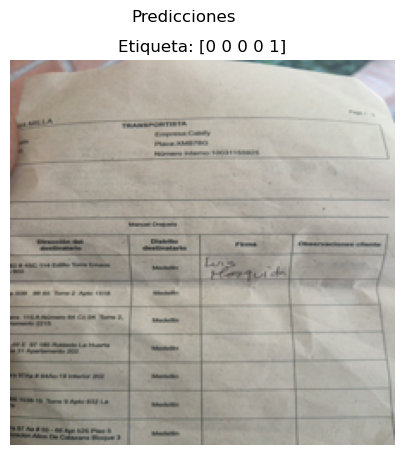



-->> row: Unnamed: 0                                                    49
filename                        12759687050_2024121512591831.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          0
etiqueta                                                       0
planilla                                                       0
Name: 49, dtype: object
img_path: ./repo_validation\12759687050_2024121512591831.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2024/12/12759687050_2024121512591831.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step
49 : Predicciones MobilNet (probabilidades): [[0.09425357 0.09356464 0.13517547 0.18292193 0.84490776]]
49 : Predicciones (MobilNet): [0 0 0 0 1]
49 : Predicciones (Yolo): [1 0 0 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

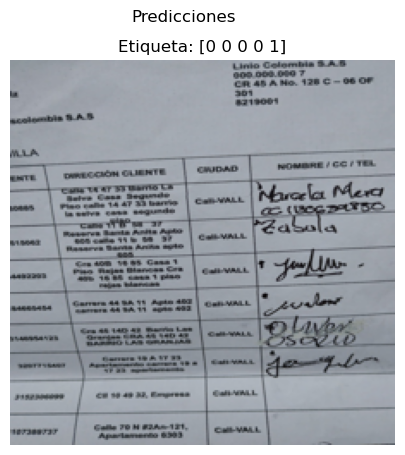



-->> row: Unnamed: 0                                                    50
filename                        12756511129_2025010712430837.jpg
urlAbsoluta    https://stlogimasest2prod.blob.core.windows.ne...
direccion                                                      1
fachada                                                        0
envio                                                          1
etiqueta                                                       0
planilla                                                       0
Name: 50, dtype: object
img_path: ./repo_validation\12756511129_2025010712430837.jpg
urlAbsoluta: https://stlogimasest2prod.blob.core.windows.net/lcstacc/2025/01/12756511129_2025010712430837.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
50 : Predicciones MobilNet (probabilidades): [[0.3583816  0.29173186 0.716813   0.2602751  0.05943872]]
50 : Predicciones (MobilNet): [0 0 1 0 0]
50 : Predicciones (Yolo): [1 0 1 0 0]
['direccion', 'fachada', 'envio', 'etiqueta', 'pla

In [5]:
# 1. Cargar el modelo (agregando custom_objects si usas métricas personalizadas)

model = tf.keras.models.load_model('eficientnetv3_classifier.v.17.keras',
    custom_objects={
        'F1ScoreMacro': lambda **kwargs: F1ScoreMacro(num_classes=4, threshold=0.5, **kwargs),
        'F1ScoreMicro': lambda **kwargs: F1ScoreMicro(threshold=0.5, **kwargs)
    })


# 2. Función para cargar y preprocesar la imagen
# cargar las imagenes
def prepare_image(row, local_image_path, target_size=(224, 224)):
    try:
        # Cargar desde archivo local
        img_path = os.path.join(local_image_path, row['filename'])
        print(f"img_path: {img_path}")
        if os.path.exists(img_path):
            image = Image.open(img_path)
        elif pd.notna(row['urlAbsoluta']):    
             urlAbsoluta = row['urlAbsoluta']
             if 'http' in urlAbsoluta:
                 print(f"urlAbsoluta: {urlAbsoluta}")
                 # Descargar la imagen desde la URL
                 response = requests.get(row['urlAbsoluta'], stream=True, timeout=10)
                 if response.status_code == 200:
                     image = Image.open(BytesIO(response.content))
                     #guardar local para el siguiente ciclo de entrenamiento/prueba
                     image.save(img_path)
             elif os.path.exists(urlAbsoluta):
                 image = Image.open(urlAbsoluta)
             else:
                 raise Exception(f'Error cargando {urlAbsoluta}, archivo no encontrado')
    
        # Convertir a RGB (en caso de que la imagen esté en otro formato, como RGBA)
        if image.mode != 'RGB':
            image = image.convert('RGB')
        
        # Redimensionar la imagen
        image = image.resize(target_size)  # Redimensionar a 224x224 para MobileNetV3
        
        # Convertir a un array de numpy y normalizar
        image = np.array(image) / 255.0  # Normalizar

        image = np.expand_dims(image, axis=0)
        return image
    except BaseException as e:
        print(f'Error en: {img_path}, Excepción: {str(e)}')
        return None


def visualize_images(images, labels, title, num_images=5):
    """
    Muestra un conjunto de imágenes con sus etiquetas asociadas.
    
    Args:
        images (np.array): Arreglo de imágenes (formato HWC, RGB).
        labels (np.array): Etiquetas asociadas a las imágenes.
        title (str): Título de la visualización.
        num_images (int): Número de imágenes a mostrar.
    """
    plt.figure(figsize=(15, 5))
    for i in range(min(num_images, len(images))):
        plt.subplot(1, num_images, i + 1)
        img = images[i]
        
        # Asegurar que la imagen esté en el rango [0, 255]
        if img.max() <= 1.0:
            img = img * 255.0
        img = img.astype("uint8")
        
        plt.imshow(img)
        plt.title(f"Etiqueta: {labels[i]}")
        plt.axis("off")
    plt.suptitle(title)
    plt.show()

def equal_by_element_array(arr1, arr2):
   if (len(arr1) != len(arr2)):
      return False
   size2 = len(arr2)
   for i in range(0, size2):
      if (arr1[i] != arr2[i]):
         return False
   return True


# 3. Cargar una imagen real (ruta a la imagen)
image_path = './repo_validation'  # Cambia a la ruta de la imagen que quieres probar
csv_validaton = FILE_INPUT_CSV
consolidate = {}

df = pd.read_csv(csv_validaton)
i = -1

print('(1) Indefinido, (2) Dirección, (3) Envío, (4) Etiqueta, (5) Fachada, (6) Recepción (7) Planilla')

for index, row in df.iterrows():
    i = i + 1
    print(f"-->> row: {row}")
    img_array = prepare_image(row, local_image_path=image_path)

    if img_array is None:
        continue

    # 4. Realizar la predicción
    predictions = model.predict(img_array)
    print(str(i), ': Predicciones MobilNet (probabilidades):', predictions)
    
    # 5. Aplicar un umbral para obtener etiquetas binarias (para multi-etiqueta)
    #threshold = 0.57  # dev set
    threshold = 0.5 # train set
    pred_labels = (predictions > threshold).astype(int)
    pred_labels_yolo = row[LABEL_COLUMNS].values.astype(int)
    print(str(i), ': Predicciones (MobilNet):', pred_labels[0])
    print(str(i), ': Predicciones (Yolo):', pred_labels_yolo)
    print(LABEL_COLUMNS)

    pred_match = 1 if equal_by_element_array(pred_labels_yolo, pred_labels[0]) else 0
    print('pred_match', pred_match)

    consolidate[row['filename']] = {
                'filename': row['filename'],
                'urlAbsoluta': row['urlAbsoluta'],
                'direccion': row['direccion'],
                'fachada': row['fachada'],
                'envio': row['envio'],
                'etiqueta': row['etiqueta'],
                'planilla': row['planilla'],
             #   'clases': row['clases'],
             #   'idArchivoEnvio': row['idArchivoEnvio'],
             #   'idArchivoCriterio': row['idArchivoCriterio'],
                'direccion_mb': pred_labels[0][0],
                'fachada_mb': pred_labels[0][1],
                'envio_mb': pred_labels[0][2],
                'etiqueta_mb': pred_labels[0][3],
                'planilla_mb': pred_labels[0][4],
                'pred_match': pred_match
    }
    
    if(i < 50):
        images = [img_array[0,...]];
        visualize_images(images, pred_labels, 'Predicciones', num_images=1)
    
    print('')
    print('')

# Crear un DataFrame a partir del diccionario
df_result = pd.DataFrame.from_dict(consolidate, orient="index")

# Guardar el DataFrame en un archivo CSV
result_file = 'result_' +  os.path.basename(csv_validaton) 
df_result.to_csv(result_file, index=False)
print('Archivo guardado exitosamente')    